# Workflow implementation

### Load libraries

In this notebook we will use the following Python libraries:
- [os](https://docs.python.org/3/library/os.html) - To create directories and work with files
- [urllib](https://docs.python.org/3/library/urllib.html) - To access to online resources
- [pandas](https://pandas.pydata.org/docs/user_guide/index.html) - To create and manage data frames (tables) in Python
- [plotly](https://plotly.com/python/) - For dynamic and interactive plotting

In [1]:
# lOAD LIBRARIES
import os
import urllib
os.environ['USE_PYGEOS'] = '0'
import pandas as pd
import geopandas as gpd
import json
import plotly.express as px

# Function for loading spatial data
%run DROUGHTS_functions.ipynb


### Define working environment and global parameters
This workflow relies on pre-proceessed data. The user will define the path to the data folder and the code below would create a folder for outputs.


In [7]:
# Set working environment

workflow_folder = './sample_data_nuts3/outputs'

# debug if folder does not exist - issue an error to check path

Load NUTS3 spatial data and define regions of interest

In [3]:
# load nuts3 spatial data
print('Load NUTS3 map')
json_nuts_path = 'https://gisco-services.ec.europa.eu/distribution/v2/nuts/geojson/NUTS_RG_01M_2021_4326_LEVL_3.geojson'
nuts = load_nuts_json(json_nuts_path)

Load NUTS3 map


## Select country codes

In [4]:
print("Choose country code from: ", nuts['CNTR_CODE'].unique())

Choose country code from:  ['HR' 'DE' 'BG' 'AT' 'AL' 'BE' 'ES' 'CH' 'CZ' 'EL' 'FR' 'FI' 'EE' 'DK'
 'CY' 'HU' 'NL' 'NO' 'LV' 'LT' 'IS' 'MK' 'MT' 'IT' 'TR' 'PL' 'RO' 'SE'
 'RS' 'PT' 'IE' 'UK' 'ME' 'LU' 'SK' 'SI' 'LI']


In [5]:
# set country code
ccode = "EL"

# validate country selection and subset regions
if not nuts['CNTR_CODE'].str.contains(ccode).any:
    print("Country code: ", ccode, " is not valid; please choose a valid country code.")
else:
    nuts = nuts.query('CNTR_CODE in @ccode')
  
    print("List of nuts2: ", nuts['NUTS_ID'].str.slice(0,4).unique())

regions = nuts['NUTS_ID']
    
# prepare output table
output = pd.DataFrame(regions, columns = ['NUTS_ID'])


List of nuts2:  ['EL62' 'EL52' 'EL61' 'EL43' 'EL54' 'EL30' 'EL51' 'EL65' 'EL64' 'EL53'
 'EL63' 'EL41' 'EL42']
Selected regions extracted successfully.
                                                                 geometry  \
Location                                                                    
EL: Ithaki, Kefallinia  MULTIPOLYGON (((21.11222 38.31611, 21.11426 38...   
EL: Lefkada             MULTIPOLYGON (((20.95923 38.64974, 20.96032 38...   
EL: Imathia             POLYGON ((22.49137 40.71127, 22.49048 40.69363...   
EL: Magnisia, Sporades  MULTIPOLYGON (((24.32680 39.33398, 24.32475 39...   
EL: Irakleio            MULTIPOLYGON (((25.49070 35.29833, 25.49187 35...   
EL: Thesprotia          MULTIPOLYGON (((20.39131 39.78848, 20.40219 39...   
EL: Ioannina            POLYGON ((21.00401 40.15407, 20.97867 40.14482...   
EL: Peiraias, Nisoi     MULTIPOLYGON (((23.93391 37.47779, 23.94228 37...   
EL: Chania              MULTIPOLYGON (((24.31741 35.35377, 24.32346 35...   
EL

## Loading drought risk data
Drought risk data is provided in the format required at the NUTS3 level for EU countries in the sample_data folder: file "XX.csv". See XX for details the workflow for the drought risk assessment

### Loading and visualizing historic risk data

In [34]:
# Load the CSV file into a DataFrame

df = pd.read_csv(os.path.join(workflow_folder,  f"droughtrisk_{ccode}_historic.csv"))


        Location NUTS_ID  hazard_raw  exposure_raw  vulnerability_raw  \
0     ES: Girona   ES512       0.773         0.520              0.272   
1   ES: Mallorca   ES532       0.776         1.000              0.420   
2    ES: Menorca   ES533       0.761         1.000              0.492   
3  ES: Barcelona   ES511       0.770         1.000              0.254   
4    ES: Badajoz   ES431       0.733         0.488              1.000   

   risk_raw  risk_cat  
0     0.109         1  
1     0.326         2  
2     0.374         2  
3     0.196         1  
4     0.358         2  


NUTS3 with the highest drought risk (TOP 15): 
                Location NUTS_ID  hazard_raw  exposure_raw  vulnerability_raw  \
28              ES: Jaén   ES616       0.882         0.761              1.000   
8   ES: Alicante/Alacant   ES521       0.803         1.000              0.829   
29            ES: Málaga   ES617       0.877         0.878              0.864   
6            ES: Córdoba   ES613       0.787

#### Plot risk map
Move the cursor to see details of the regions. 

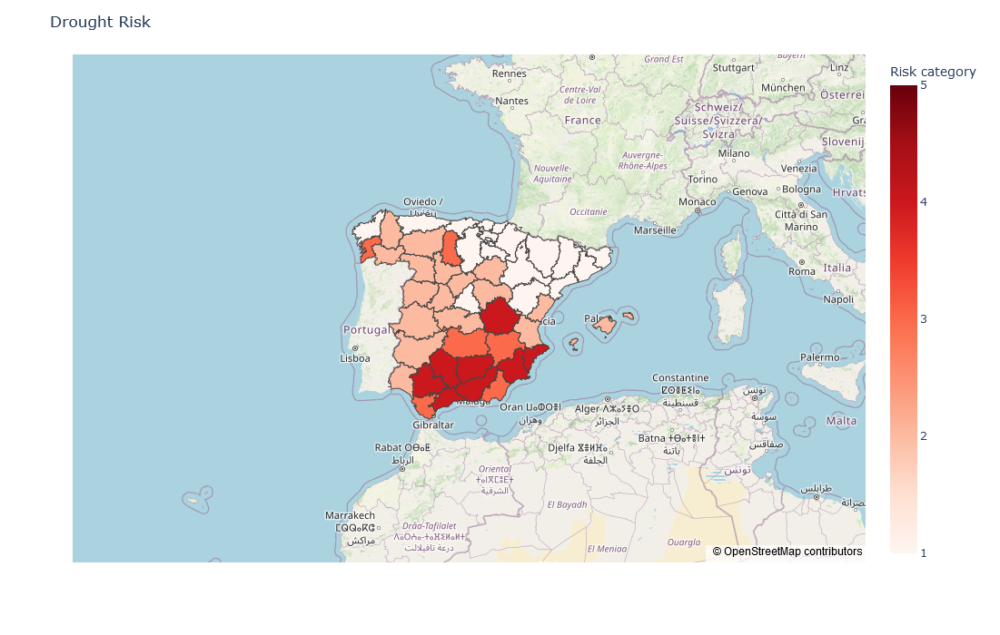

In [35]:
x_nuts, y_nuts = gpd.GeoSeries(nuts.geometry).unary_union.centroid.xy

fig = px.choropleth_mapbox(df, geojson=nuts.geometry, locations='Location', color='risk_cat',\
                           color_continuous_scale="reds", range_color = [1,5], mapbox_style="open-street-map")


fig.update_geos(fitbounds="locations", visible=False)

fig.update_layout(title="Drought Risk",
                  mapbox_center = {"lat": list(y_nuts)[0], "lon": list(x_nuts)[0]},
                  mapbox_zoom=4,
                  height=700,
                 coloraxis_colorbar=dict(
                    title= "Risk category",
                    tickvals = [1, 2, 3, 4, 5],
                    ticktext = [1, 2, 3, 4, 5]
                 ))

fig.show()

#### Plot risk components 3D scatter plot



Explore drought risk dimensions (marker size indicates risk category): 
Deselect specific countries by click on the country codes on the right.
Select a specific country by double clicking on it.


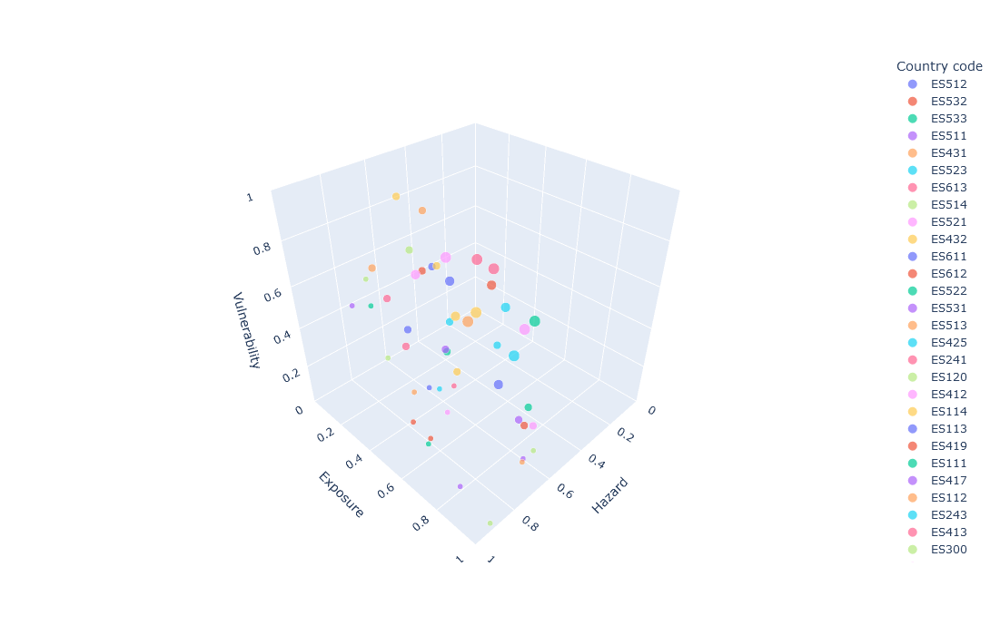

In [36]:
print('\n')
print('Explore drought risk dimensions (marker size indicates risk category): ')
print('Deselect specific countries by click on the country codes on the right.')
print('Select a specific country by double clicking on it.')
fig2 = px.scatter_3d(df, x='hazard_raw',\
                     y='exposure_raw',\
                     z='vulnerability_raw',\
                     size = 'risk_cat',\
                    color='NUTS_ID') # nuts.index
fig2.update_layout(
    scene = dict(
        xaxis = dict(nticks=6, range=[0,1]),\
        xaxis_title = 'Hazard',\
        yaxis = dict(nticks=6, range=[0,1]),\
        yaxis_title = 'Exposure',\
        zaxis = dict(nticks=6, range=[0,1]),
        zaxis_title='Vulnerability',\
        aspectmode = "manual",
        aspectratio = dict(x = 0.9, y = 0.9, z = 0.9)),
    legend = dict(title = "Country code"),
    height = 700)

fig2.show()

print('\n')

In [37]:
### Comparing historic risk data with future risk

In [10]:
# Load the CSV files into a DataFrame
data = ['historic',  'ssp126_ff',  'ssp370_ff',  'ssp585_ff']
# ,'ssp126_nf', 'ssp370_nf', 'ssp370_ff', 'ssp585_nf', 'ssp585_ff'
count = 0

for d in data:
    df = pd.read_csv(os.path.join(workflow_folder,  f"droughtrisk_{ccode}_{d}.csv"))
    # Print the first 5 rows of the DataFrame
    df['data']=f"{d}" #create a new column with the data specification
    if count == 0:
        df_ = df
        count = 1
    else:
        df_ = pd.concat([df_, df], axis=0) #concatenate the  data in a single dataframe

#print (df_.head(10))

#to save it 
#df_.to_csv('out.csv', index=False) 

#### Plot risk map
Move the cursor over the regions to see their details. Change dataset using the animation frame at the bottom.

In [11]:
x_nuts, y_nuts = gpd.GeoSeries(nuts.geometry).unary_union.centroid.xy

fig = px.choropleth_mapbox(df_, geojson=nuts.geometry, locations='Location', color='risk_cat',\
                  animation_frame = 'data', color_continuous_scale="reds", range_color = [1,5], mapbox_style="open-street-map")


fig.update_geos(fitbounds="locations", visible=False)

fig.update_layout(title="Drought Risk",
                  mapbox_center = {"lat": list(y_nuts)[0], "lon": list(x_nuts)[0]},
                  mapbox_zoom=4,
                  height=700,
                 coloraxis_colorbar=dict(
                    title= "Risk category",
                    tickvals = [1, 2, 3, 4, 5],
                    ticktext = [1, 2, 3, 4, 5]
                 ))

fig.show()

#### Plot risk components scatter plot 
Compare historic vs future drought risk for each country.


In [12]:
print('\n')
print('Explore historic and future drought risk for each country: ')
print('Deselect specific countries by click on the country codes on the right.')
print('Select a specific country by double clicking on it.')
fig2 = px.scatter(df_, x='data',\
                     y='risk_cat',\
                     color='NUTS_ID')
fig2.update_layout(
        xaxis_title = 'Data',\
        #yaxis = dict(nticks=4),\
        yaxis_title = 'Risk Category',\
legend = dict(title = "Country code"),
height = 700)

fig2.update_traces(marker=dict(size=10))

fig2.show()

print('\n')

#output.to_csv(os.path.join(workflow_folder, 'outputs', 'droughtrisk_' + ccode + '.csv'))



Explore historic and future drought risk for each country: 
Deselect specific countries by click on the country codes on the right.
Select a specific country by double clicking on it.


#### Plot risk components 3D scatter plot



Explore drought risk dimensions (marker size indicates risk category): 
Deselect specific countries by click on the country codes on the right.
Select a specific country by double clicking on it.
Change the data using the animation frame at the bottom.


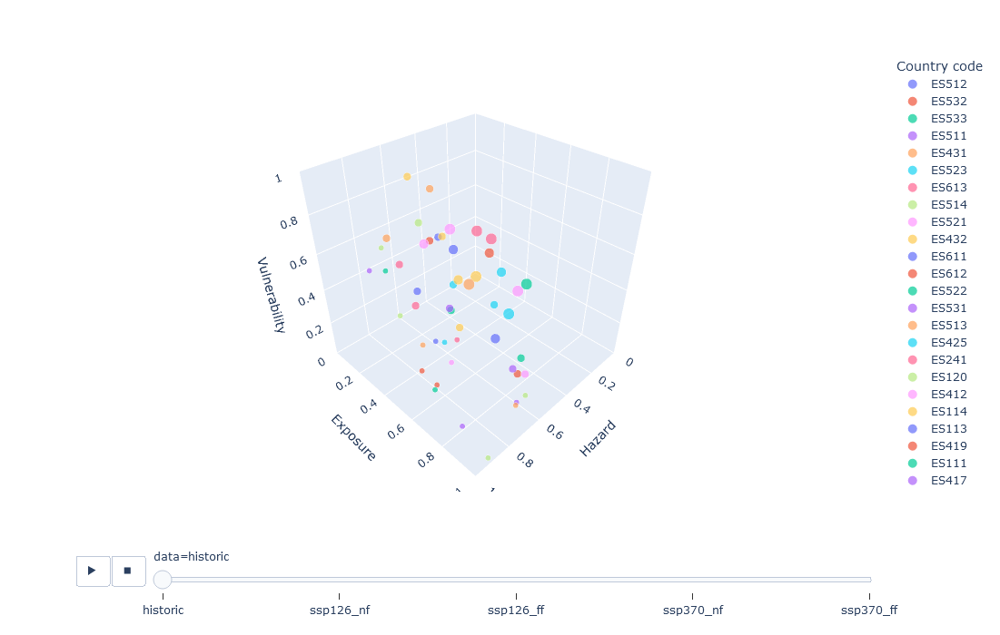

In [41]:
print('\n')
print('Explore drought risk dimensions (marker size indicates risk category): ')
print('Deselect specific countries by click on the country codes on the right.')
print('Select a specific country by double clicking on it.')
print('Change the data using the animation frame at the bottom.')
fig2 = px.scatter_3d(df_, x='hazard_raw',\
                     y='exposure_raw',\
                     z='vulnerability_raw',\
                     size = 'risk_cat',\
                     color='NUTS_ID',\
                     animation_frame='data')
fig2.update_layout(
    scene = dict(
        xaxis = dict(nticks=6, range=[0,1]),\
        xaxis_title = 'Hazard',\
        yaxis = dict(nticks=6, range=[0,1]),\
        yaxis_title = 'Exposure',\
        zaxis = dict(nticks=6, range=[0,1]),
        zaxis_title='Vulnerability',\
        aspectmode = "manual",
        aspectratio = dict(x = 0.9, y = 0.9, z = 0.9)),
    legend = dict(title = "Country code"),
    height = 700)

fig2.show()

print('\n')

#output.to_csv(os.path.join(workflow_folder, 'outputs', 'droughtrisk_' + ccode + '.csv'))